<a href="https://colab.research.google.com/github/inc0878/Xray/blob/main/data_porsesing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import cv2

# CLAHE + Gamma Correction
def apply_clahe_gamma(img, gamma=1.2):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_clahe = clahe.apply(img)

    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    img_gamma = cv2.LUT(img_clahe, table)

    return img_gamma

# Pipeline untuk gambar grayscale
def preprocess_pipeline(img_path, target_size=(224, 224), gamma=1.2, for_model=False):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Gambar tidak ditemukan: {img_path}")

    img = cv2.resize(img, target_size)
    img = apply_clahe_gamma(img, gamma)

    if for_model:
        img = img.astype('float32') / 255.0
        img = np.expand_dims(img, axis=-1)  # (H, W, 1)
    return img

# Load semua gambar & simpan hasil ke folder
def load_preprocess_and_save_dataset(base_dir, output_dir,
                                     target_size=(224, 224),
                                     gamma=1.2,
                                     save_mode='png'):
    os.makedirs(output_dir, exist_ok=True)
    images = []
    labels = []

    for label_name in os.listdir(base_dir):
        label_folder = os.path.join(base_dir, label_name)
        if os.path.isdir(label_folder):
            save_label_folder = os.path.join(output_dir, label_name)
            os.makedirs(save_label_folder, exist_ok=True)

            for img_file in os.listdir(label_folder):
                img_path = os.path.join(label_folder, img_file)
                try:
                    img = preprocess_pipeline(img_path, target_size, gamma,
                                              for_model=(save_mode == 'npy'))

                    save_path = os.path.join(save_label_folder, os.path.splitext(img_file)[0])

                    if save_mode == 'png':
                        cv2.imwrite(save_path + ".png", img)
                    elif save_mode == 'npy':
                        np.save(save_path + ".npy", img)

                    images.append(img)
                    labels.append(label_name)
                except Exception as e:
                    print(f"Gagal memproses {img_path}: {e}")

    print(f"Jumlah gambar berhasil diproses & disimpan: {len(images)}")
    return np.array(images), np.array(labels)


In [ ]:
base_path = r"D:/materi/semester6/data_mining/Xray/Dataset_berlabel_SingleLabel"

output_path = r"D:/materi/semester6/data_mining/Xray/Dataset_Preprocessed_PNG"
x_data, y_labels = load_preprocess_and_save_dataset(base_path, output_path, save_mode='png')

output_path_npy = r"D:/materi/semester6/data_mining/Xray/Dataset_Preprocessed_NPY"
x_data, y_labels = load_preprocess_and_save_dataset(base_path, output_path_npy, save_mode='npy')



Jumlah gambar berhasil diproses & disimpan: 91324
Jumlah gambar berhasil diproses & disimpan: 91324


In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

def show_comparisons_all_labels(original_root, processed_root, num_images=5, target_size=(224, 224)):
    labels = os.listdir(original_root)

    for label in labels:
        original_label_path = os.path.join(original_root, label)
        processed_label_path = os.path.join(processed_root, label)

        if not os.path.isdir(original_label_path) or not os.path.isdir(processed_label_path):
            continue

        img_files = sorted(os.listdir(original_label_path))[:num_images]

        for img_file in img_files:
            original_path = os.path.join(original_label_path, img_file)
            processed_path = os.path.join(processed_label_path, img_file)

            original = cv2.imread(original_path, cv2.IMREAD_GRAYSCALE)
            processed = cv2.imread(processed_path, cv2.IMREAD_GRAYSCALE)

            if original is None or processed is None:
                print(f"Gagal membuka gambar: {img_file}")
                continue

            # Resize jika ukuran tidak sesuai
            original = cv2.resize(original, target_size)
            processed = cv2.resize(processed, target_size)

            # Tampilkan berdampingan
            plt.figure(figsize=(10, 4))
            plt.suptitle(f"Label: {label} | File: {img_file}", fontsize=12)

            plt.subplot(1, 2, 1)
            plt.imshow(original, cmap='gray')
            plt.title("Sebelum")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(processed, cmap='gray')
            plt.title("Sesudah (CLAHE + Gamma)")
            plt.axis('off')

            plt.tight_layout()
            plt.show()


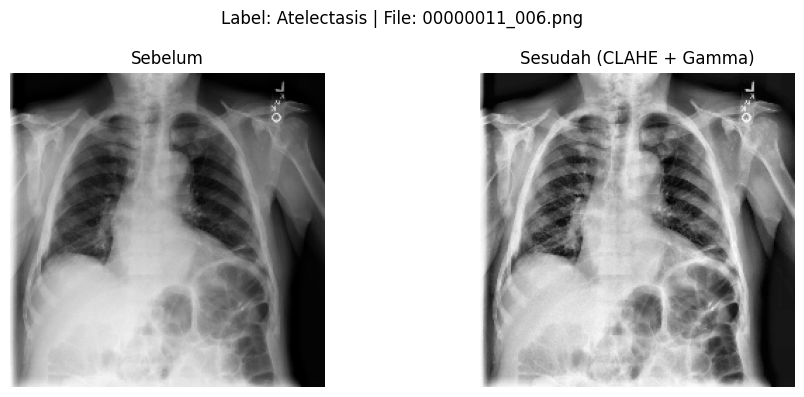

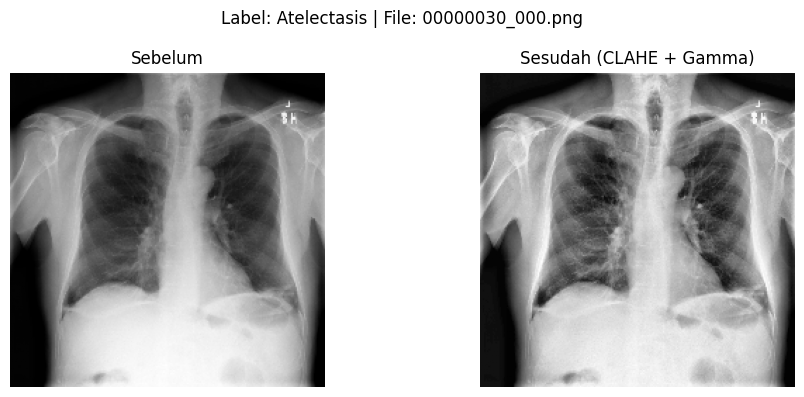

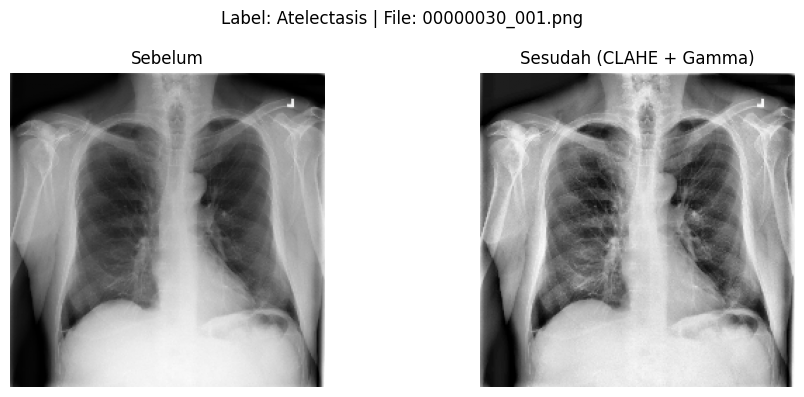

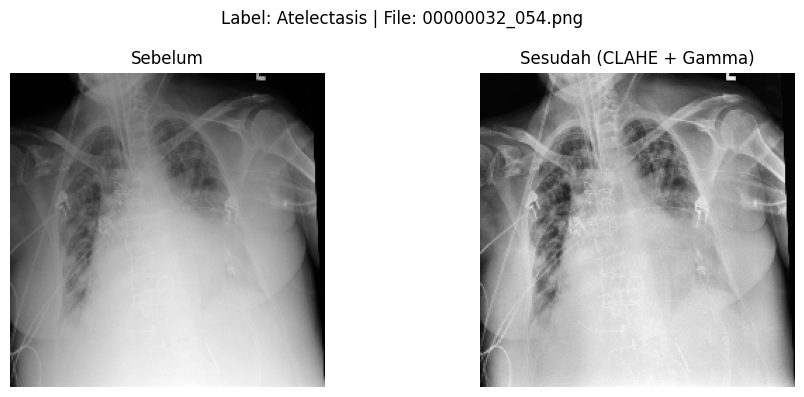

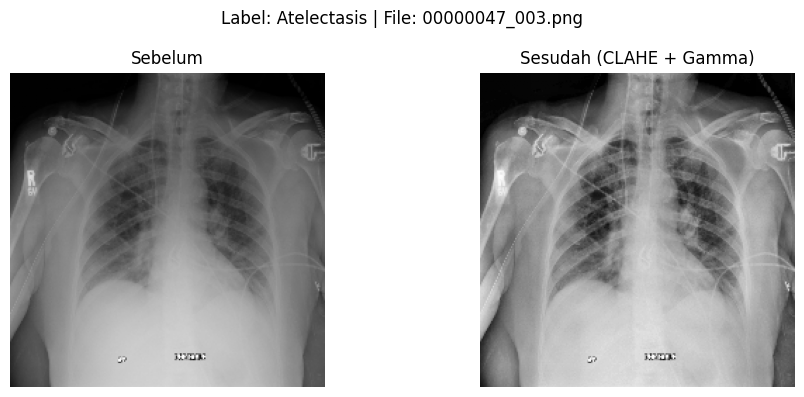

...

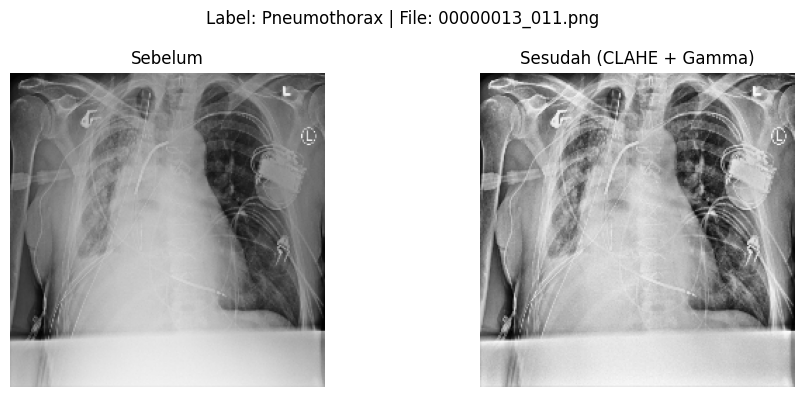

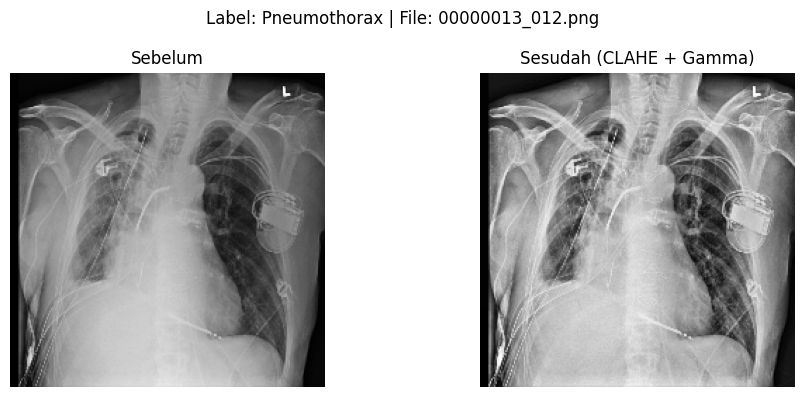

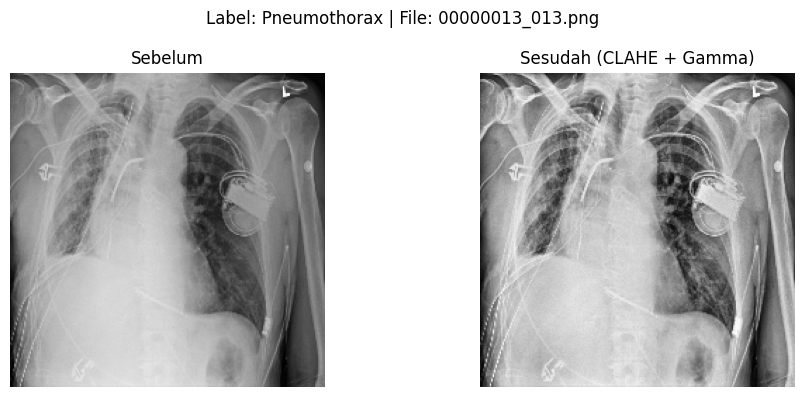

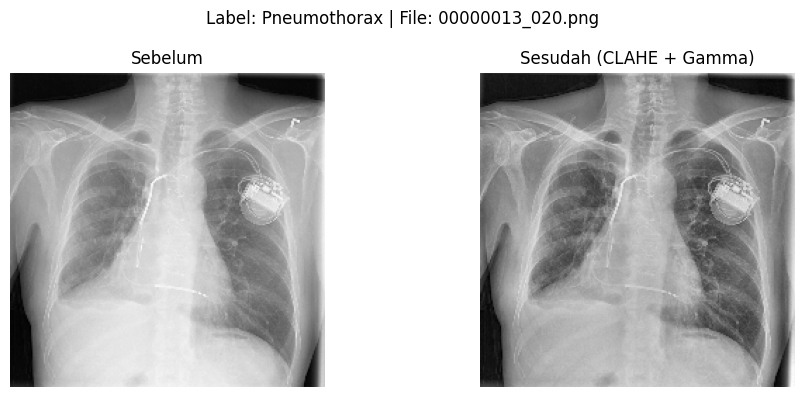

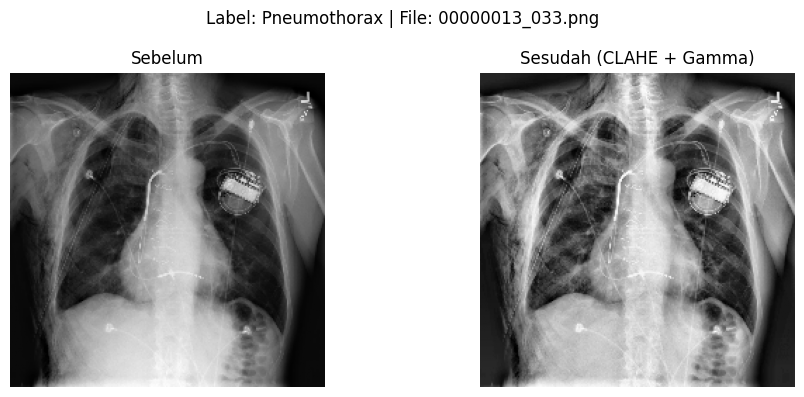

In [ ]:
original_root = r"D:/materi/semester6/data_mining/Xray/Dataset_berlabel_SingleLabel"
processed_root = r"D:/materi/semester6/data_mining/Xray/Dataset_Preprocessed_PNG"

show_comparisons_all_labels(original_root, processed_root, num_images=5)


In [ ]:
import os
import shutil
import random

def sample_and_save_images(input_dir, output_dir, max_per_label=1500, seed=42):
    os.makedirs(output_dir, exist_ok=True)
    random.seed(seed)

    total_moved = 0

    for label_name in os.listdir(input_dir):
        label_folder = os.path.join(input_dir, label_name)
        if not os.path.isdir(label_folder):
            continue

        save_label_folder = os.path.join(output_dir, label_name)
        os.makedirs(save_label_folder, exist_ok=True)

        all_images = [f for f in os.listdir(label_folder)
                      if os.path.isfile(os.path.join(label_folder, f)) and
                         f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        random.shuffle(all_images)

        n_samples = min(len(all_images), max_per_label)
        selected_images = all_images[:n_samples]

        for img_file in selected_images:
            src_path = os.path.join(label_folder, img_file)
            dst_path = os.path.join(save_label_folder, img_file)
            shutil.copy2(src_path, dst_path)
            total_moved += 1

        print(f"Label '{label_name}': {n_samples} gambar disalin.")

    print(f"\nTotal gambar yang disalin: {total_moved}")


In [ ]:
input_dir = r"D:/materi/semester6/data_mining/Xray/Dataset_Preprocessed_PNG"
output_dir = r"D:/materi/semester6/data_mining/Xray/Dataset_Sampled1500"

sample_and_save_images(input_dir, output_dir, max_per_label=1500)


Label 'Atelectasis': 1500 gambar disalin.
Label 'Cardiomegaly': 1093 gambar disalin.
Label 'Consolidation': 1310 gambar disalin.
Label 'Edema': 628 gambar disalin.
Label 'Effusion': 1500 gambar disalin.
Label 'Emphysema': 892 gambar disalin.
Label 'Fibrosis': 727 gambar disalin.
Label 'Hernia': 110 gambar disalin.
Label 'Infiltration': 1500 gambar disalin.
Label 'Mass': 1500 gambar disalin.
Label 'No Finding': 1500 gambar disalin.
Label 'Nodule': 1500 gambar disalin.
Label 'Pleural_Thickening': 1126 gambar disalin.
Label 'Pneumonia': 322 gambar disalin.
Label 'Pneumothorax': 1500 gambar disalin.

Total gambar yang disalin: 16708
